<a href="https://colab.research.google.com/github/RohanRVC/-End-to-End-Multi-Class-Dog-Breed-Classifciation/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🐶🐕‍🦺 End-to-End Multi-Class Dog Breed Classifciation

> Indented block



This notebook builds an end-to-end multi-class image classifier using tensorflow 2.0 and TensorFLow Hub.

## 1. Problem

Identifying the breed of a dog an image of a dog.

When I'm sitting at the cafe and i take a photo of a dog mi want to know what breed of dog it is?

## 2. Data

THe data we're using is from Kaggle's dog breed identification competition.

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of dog of each test image.

## 4. Features

Some information about the data-:
* We're dealing with images (unstructured data) so it's probably best we use deep learning./ transfer learning.
* There are 120 breeds of dogs ( that means there are 120 different classes).
* There are around 10K+ Images in training sets (these images have labels).
* THere are around 10K+ images in the test set(these images have no labels, because we'll want to predict them).

### Getting workspace ready

* import Tensorflow
* import tensorflow hub (to pick a model)
* Make sure we're using GPU

In [ ]:
import pandas as pd , numpy as np

In [ ]:
#Important necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF Version:-",tf.__version__)
print("TF hub Version:-",hub.__version__)

#Check for GPU Availability
print("GPU",'available (YESSSSS!!!!!)' if tf.config.list_physical_devices("GPU") else "Not available :(")


TF Version:- 2.12.0
TF hub Version:- 0.13.0
GPU available (YESSSSS!!!!!)


## Getting all ML Models , our data has be in numerical format. So that's what we'll be doing first. Turing into Tensors

LEt's start by accessing our data and checking out labels.

In [ ]:
labels=pd.read_csv('/content/drive/MyDrive/Dog Vision/dog-breed-identification/labels.csv')

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
labels.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
print(labels.describe())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


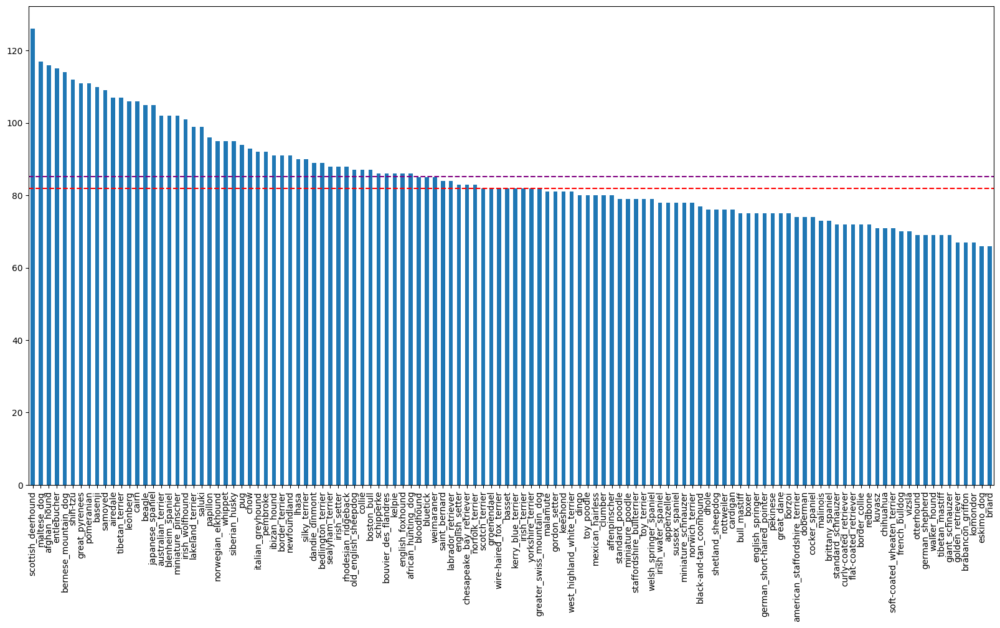

In [ ]:
import matplotlib.pyplot as plt
labels.breed.value_counts().plot.bar(figsize=(20,10))
#plt.xticks(rotation=0);
plt.axhline(labels.breed.value_counts().median(),color='r',linestyle='--')
plt.axhline(labels.breed.value_counts().mean(),color='purple',linestyle='--')

In [ ]:
labels.breed.value_counts().median()

82.0

In [ ]:
#Lets view a image
from IPython.display import Image

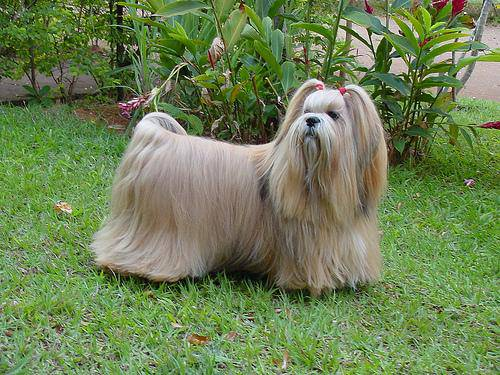

In [ ]:
Image('/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/0a3f1898556115d6d0931294876cd1d9.jpg')

### Getting images and their labels

In [ ]:
filenames=[f'/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/{i}.jpg' for i in labels.id ]


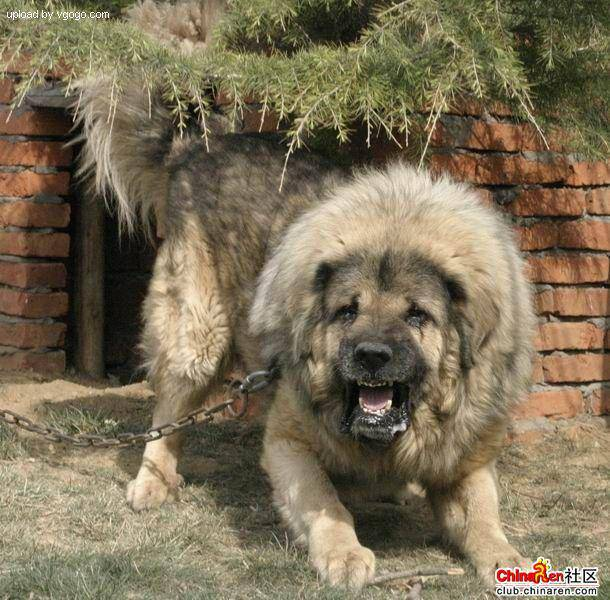

In [ ]:
Image(filenames[9000])

In [ ]:
labels.breed.iloc[9000]

'tibetan_mastiff'

Since we've noe got our training image filepath in a list , let's prepare our labels.

In [ ]:
breed_names=labels.breed.to_numpy()
breed_names

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
# See if numbers of labels matches the number of filenames
if len(labels)==len(filenames):
  print("Yes")

Yes


In [ ]:
#Find the unique labels values
unique_breeds=labels.breed.unique()
len(unique_breeds)

120

In [ ]:
#Turn a single label into an array of booleans
print(breed_names[0])

boston_bull


In [ ]:
len(breed_names)

10222

In [ ]:
breed_names[0]==unique_breeds

array([ True, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
#Turn every labels into a boolean array
boolean_labels=[label ==unique_breeds for label in breed_names ]
boolean_labels[:2]

[array([ True, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False,  True, False, False, False, Fal

In [ ]:
# Example : Turning boolean array into integers
print(breed_names[0])
print(np.where(unique_breeds==breed_names[0])) #Index where label occurs
print(boolean_labels[0].argmax()) #index where label occur in boolean array
print(boolean_labels[0].astype(int)) #there will be a 1 where the sample label will occurs

boston_bull
(array([0]),)
0
[1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
np.array(boolean_labels).shape

(10222, 120)

In [ ]:
bools_cat=pd.DataFrame(boolean_labels).T.astype("category")

In [ ]:
bools_cat[0].cat.codes

0      1
1      0
2      0
3      0
4      0
      ..
115    0
116    0
117    0
118    0
119    0
Length: 120, dtype: int8

In [ ]:
len(breed_names)

10222

### Creating our own validation set...

Since the dataset from Kaggle dose'nt come with a validation set, we're going to create our own.

In [ ]:
# Setup X and y variables
X=filenames
y=boolean_labels

We're going to start off experimenting with ~1000 images and increase as needed.

In [ ]:
# SEt number of images to use for experimenting
NUM_IMAGES=1000 #@param {type:"slider",min=1000,max:10000,step:1000}


In [ ]:
from tensorflow.python import train
# LEt's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train,X_val,y_train,y_val=train_test_split(X[:NUM_IMAGES],y[:NUM_IMAGES],
                                             test_size=0.2,random_state=42)

len(X_train),len(y_train),len(X_val),len(y_val)


(800, 800, 200, 200)

In [ ]:
# LEt's have a geez at the training data
X_train[:2],y_train[:2]

(['/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False,  True, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, 

## Preprocessing images , (Turing Images into Tensors)

To preprocess our images into Tensors we're going to write a fucntuon which does a few things-:
* Take an  image filepath as input
* Use Tensorflow to read  the file and save it to a variable `image`
* Turn our `image` a jpg into tensorflow
* Resize the image to a shape of (224,224)
* Return the modified `image`

Before we do , let's see what importing an image looks like.

In [ ]:
#Convert image to numpy array
from matplotlib.pyplot import imread
image=imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
 image.max(),image.min() #RGB Color

(255, 0)

In [ ]:
#turn image into tensors
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

Now we've seen what an image looks like as a Tensors, let's make a function to preprocess them.
* Take an  image filepath as input
* Use Tensorflow to read  the file and save it to a variable `image`
* Turn our `image` a jpg into tensorflow
* Normalize our image (convert color channel values fromm 0-255 to 0-1).
* Resize the image to a shape of (224,224)
* Return the modified `image`


In [ ]:
#Define image size
IMG_SIZE=224

# Create a function for preprocessing images

def process_image(image_path,IMG_SIZE=224):
  """
  Take a image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image=tf.io.read_file(image_path)

  #Turn the jpeg image into numerical ; Tensor with 3 Color channel(R,G,B)
      #tf.image.decode_image -: will give no shape error
  image=tf.image.decode_jpeg(image,channels=3)

  #Convert the color channel values from 0-255 to 0-1 values
  image=tf.image.convert_image_dtype(image,tf.float32)

  # Resize the image to our  desire value(224,224)
  image=tf.image.resize(image,[IMG_SIZE,IMG_SIZE])

  return image

In [ ]:
# tf.image.resize()

In [ ]:
tensorss=tf.io.read_file(filenames[9000])
#tensor

In [ ]:
tensorss=tf.image.decode_jpeg(tensorss,channels=3)
#tensorss

In [ ]:
imread(filenames[9000]).shape

(600, 610, 3)

In [ ]:
image=tf.image.convert_image_dtype(tensorss,tf.float32)
image

<tf.Tensor: shape=(600, 610, 3), dtype=float32, numpy=
array([[[0.48235297, 0.50980395, 0.34509805],
        [0.5803922 , 0.60784316, 0.4431373 ],
        [0.47450984, 0.5019608 , 0.3372549 ],
        ...,
        [0.30588236, 0.33333334, 0.20392159],
        [0.25882354, 0.28627452, 0.15686275],
        [0.2509804 , 0.2901961 , 0.15686275]],

       [[0.5568628 , 0.58431375, 0.41960788],
        [0.59607846, 0.62352943, 0.45882356],
        [0.4666667 , 0.49411768, 0.32941177],
        ...,
        [0.227451  , 0.24705884, 0.12156864],
        [0.2509804 , 0.2784314 , 0.14901961],
        [0.24313727, 0.28235295, 0.14901961]],

       [[0.6117647 , 0.6392157 , 0.4666667 ],
        [0.5764706 , 0.6039216 , 0.43137258],
        [0.44705886, 0.47450984, 0.3019608 ],
        ...,
        [0.26666668, 0.28627452, 0.16078432],
        [0.27058825, 0.2901961 , 0.17254902],
        [0.26666668, 0.29411766, 0.17254902]],

       ...,

       [[0.30588236, 0.32156864, 0.21568629],
        [0.28

## Turning our Data into Batches

Why turn Data into Batches?

Let's say you are trying to process 10K+ images in one go... they all might not fit into memory...

SO that why we do about 32 (This is batch size)images at a time (you can manually adjust the batch size if needed)

In order to use Tensorflow effectively , we need our data in form of Tensor tuples which look like this `(image,label)`

In [ ]:
# Create a single function to return a tuple (image,label)
def get_image_label(image_path,label):
  """
  Take an image file path name and the associated label,
  processes the image and returns a tuple of `(image,label)`
  """
  image=process_image(image_path)

  return image,label

In [ ]:
# Demo of the above function
(process_image(X[9000]),tf.constant(y[9000]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.5868219 , 0.6142729 , 0.44956705],
         [0.51346385, 0.54091483, 0.36888915],
         [0.58226043, 0.6097114 , 0.4371624 ],
         ...,
         [0.23270757, 0.2523154 , 0.13466835],
         [0.22784922, 0.24745706, 0.12196685],
         [0.2511552 , 0.28023472, 0.15028012]],
 
        [[0.50232375, 0.52774394, 0.3511333 ],
         [0.4631647 , 0.4896906 , 0.30976266],
         [0.55413043, 0.58144134, 0.39915845],
         ...,
         [0.20898524, 0.22859308, 0.11094601],
         [0.24645592, 0.26606375, 0.14057356],
         [0.204972  , 0.22051823, 0.10896359]],
 
        [[0.5203432 , 0.5321079 , 0.34779412],
         [0.43865862, 0.45042333, 0.27133605],
         [0.3544581 , 0.3662228 , 0.19022675],
         ...,
         [0.27867478, 0.29828262, 0.18063554],
         [0.28268862, 0.30229646, 0.17680626],
         [0.26181737, 0.26073167, 0.16824257]],
 
        ...,
 
        [[0.4235383 , 0.43922457

Now we've got a way to turn our data into tuples of Tensors in the form: `(image,labels)` let's make a function to turn all our data (`X`&`y`) into batches,

In [ ]:
# Define the batch size ,32 is good start

BATCH_SIZE=32

#CREATW a function to turn data into batches
def create_data_batches(X,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  """
  Creates batches of data of image (X)  and label(y) pairs.
  Shuffles the data if it's training Data but dose'nt shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """

  #If data is  a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches.,...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X)))#only filepaths (no labels)
    data_batch=data.map(process_image).batch(batch_size)

    return data_batch

  #If data is valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data BAtches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))#filepaths #labels
    data_batch=data.map(get_image_label).batch(batch_size)
    return data_batch

  else:
    print("Creating training data batches....")
    # Turn filepaths and labels into Tensors
    data=tf.data.Dataset.from_tensor_slices((tf.convert_to_tensor(X),tf.convert_to_tensor(y)))

    #Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data=data.shuffle(buffer_size=len(X))

    #Create (image,label) tuples (this also turns the image a preprocessed image)
    data=data.map(get_image_label)

    #Turn thr training data into batches
    data_batch=data.batch(batch_size)

    return data_batch

In [ ]:
tf.data.Dataset.from_tensor_slices([[1,2,3,4],[5,6,7,8]])

<_TensorSliceDataset element_spec=TensorSpec(shape=(4,), dtype=tf.int32, name=None)>

In [ ]:
list(tf.data.Dataset.range(15).batch(5).as_numpy_iterator())

[array([0, 1, 2, 3, 4]), array([5, 6, 7, 8, 9]), array([10, 11, 12, 13, 14])]

In [ ]:
train_data=create_data_batches(X_train,y_train)
val_data=create_data_batches(X_val,y_val,valid_data=True)

Creating training data batches....
Creating validation data BAtches...


In [ ]:
len(train_data)

25

In [ ]:
train_data.element_spec

(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))

In [ ]:
# trainsss=next(train_data.as_numpy_iterator())
# trainsss #it will shuffle

In [ ]:
# valss=next(val_data.as_numpy_iterator())
# valss #no shuffle

In [ ]:
val_data.element_spec

(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))

## Visualize Dara BAtches

Our data is not in batches , however , these can be little hard to understand/comprehend, let's visualize them!!

In [ ]:
import matplotlib.pyplot as plt
# Create a function for viewsing images in a dara batch
def show_images(images,labels,no=25):
  """
  Display a plot of 25 images and their labesl from a data batch.
  """
  #setup  a figure
  plt.figure(figsize=(10,10))
  #loop through 25 (for displaying 25 images):
  for i in range(no):
    #Create 5 row , 5 columns
    ax=plt.subplot(5,5,i+1)
    #Display an image
    plt.imshow(images[i])
    #Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # turn the grid lines off

    #plt.axis('off')


In [ ]:
unique_breeds[y[9000].argmax()]

'tibetan_mastiff'

In [ ]:
train_images,train_labels=next(train_data.as_numpy_iterator())


In [ ]:
len(train_images),len(train_labels)

(32, 32)

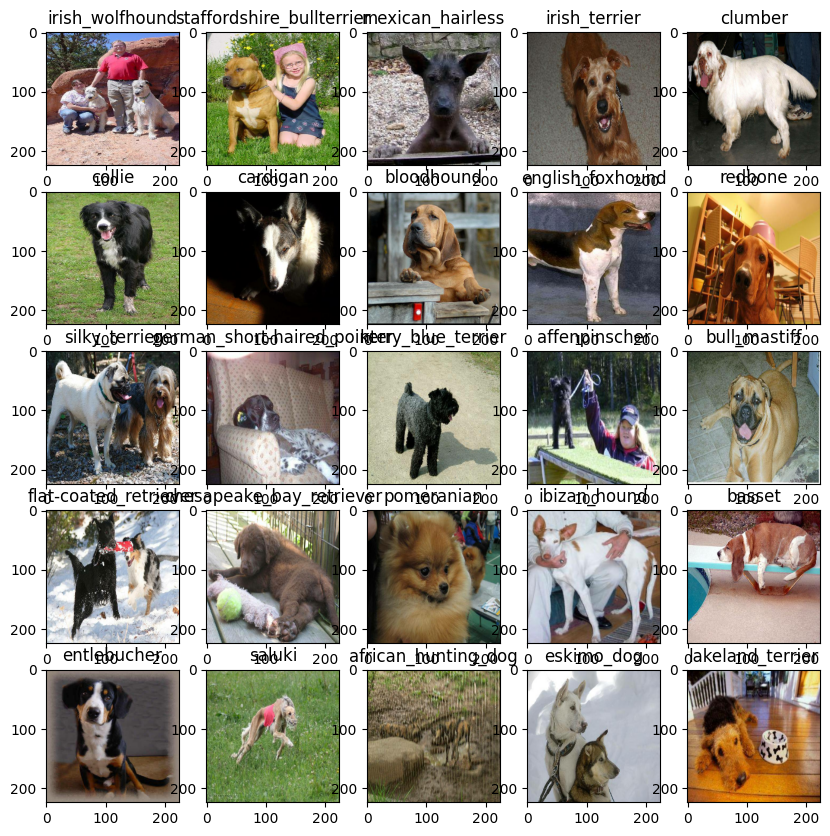

In [ ]:
show_images(train_images,train_labels)

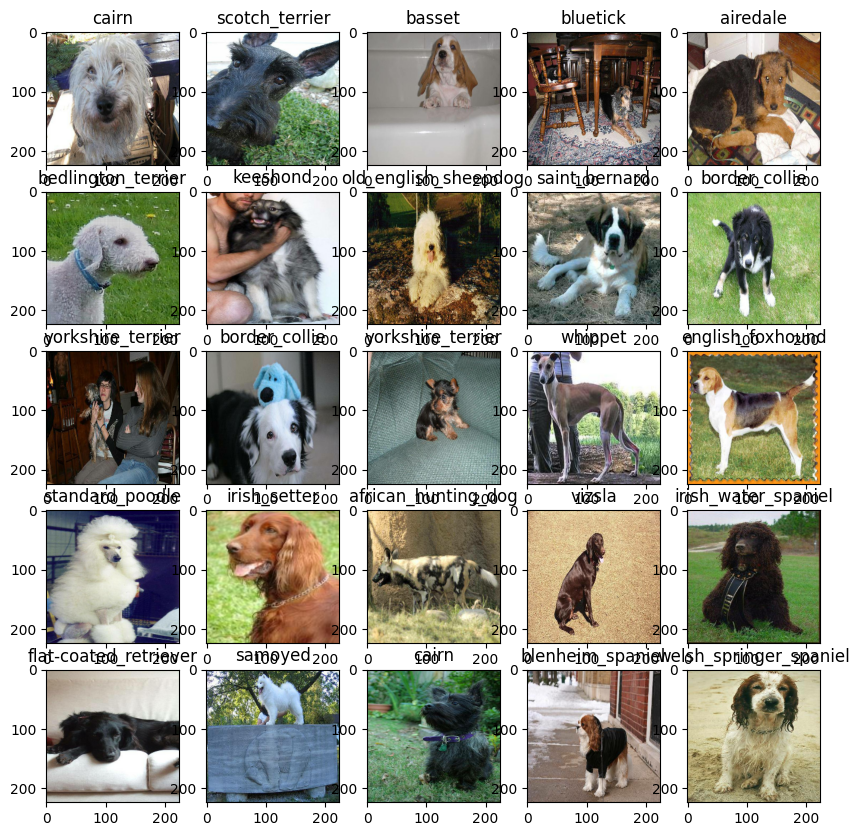

In [ ]:
val_images,val_labels=next(val_data.as_numpy_iterator())
show_images(val_images,val_labels)

## Building our MOdel

Before we build a model , there are few things we need to define-:

* THe `input` shape (our images shape, in the form of Tensors) of our model.
* THe output (image labels,in the form of Tensors) of our model.
* THe URL of the model we want to use.


In [ ]:
#Setup input shape to the model
INPUT_SIZE=[None,IMG_SIZE,IMG_SIZE,3] #batch , height,width,color channels

#Setup output shape of our model
OUTPUT_SHAPE=len(unique_breeds)

#Setup model URL from Tensorflow HUb
Model_URL='https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5'

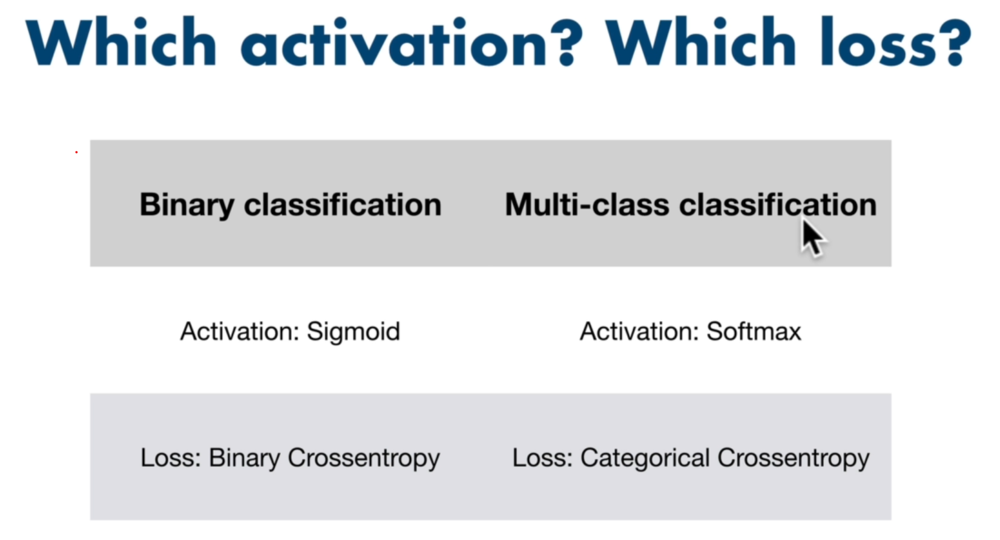

Now we have got our inputs, outputs and model ready to go... Let's put them together into a Keras deep Learning model..

Knowing this, let's create a function which-:
* Take the input shape and the model we've chosen as parameters.
* DEfines the layers in a Keras model in sequnetial fashion (do this first , then this , then that).
* Compiles the model (says it should be evaluted and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model
All of the steps can be found in https://www.tensorflow.org/guide/basics

In [ ]:
#Create a function which builds a Keras model
def create_model(input_shape=INPUT_SIZE,output_shape=OUTPUT_SHAPE,model_url=Model_URL):
  print("BUild model with-:",model_url)

  #Setup the model layers
  model=tf.keras.Sequential([
      hub.KerasLayer(model_url), #layer 1 (input layer)
      tf.keras.layers.Dense(units=output_shape,activation='softmax') #layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # a loss is a measure of learning
      # it is measure of how well it is guessing  , the higher the loss the worst thew prediction is
      optimizer=tf.keras.optimizers.Adam(),
      metrics=['accuracy']
  )

  model.build(input_shape)
  return model

In [ ]:
model=create_model()
model.summary()

BUild model with-: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks

Callbacks are helper funcitons a model can use during training to do such things as save in progess , check its progress or stop training early if a model stops improving.

 we will create to callbacks, one for TensorBoard which helps track our model progress (lower it goes and how much hight the accuracy is) and another for early stopping which prevents our model from training for two long.

 ### TensorBoard Callback

 TO set a tensorboard callback we need to do 3 things-:
 1. Load the TensorBoard notebook extension
 2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
 3. Visualize our models training logs with `%tensorboard` magic function (we will do this after model training).

In [ ]:
# load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime,os

#Create a function to build a TensorBoard callBack
def create_tensorboard_callback():
  #Createw a log directory for storing TensorBoard
  logdir=os.path.join('/content/drive/MyDrive/Dog Vision/dog-breed-identification/logs',
                      #make it so the logs get tracked whenever we run as expirement
                datetime.datetime.now().strftime("%Y%m%d-%H%M%S") )
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping CallBacks

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metrics stops improving
https://keras.io/api/callbacks/early_stopping/

In [ ]:
# Create early stopping callbacks
early_stopping=tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                patience=3)

## Training a model (on a subset of data)

Our first model is only goingto train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS=100 # params {type:'slider',min:10,max:100,step:10}

In [ ]:
# Check to make sure we're still running on a GPU
print("GPU","available (YES!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")


GPU available (YES!!!!!)


# Let's  create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard calback using `create_tensorboard_callback`
* Call the `fit()` function on our passing if the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use
* Return the model

In [ ]:
#Build a function to train and return a trained model
def train_model():
  """
  Trains a give model and returns the trained version.
  """
  #  Create a model
  model=create_model()
  # Create new TensorBoard session everytime we train a model
  tensorboard=create_tensorboard_callback()
  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])
  # Return the fitted model
  return model


In [ ]:
#Fit the model to the data
model=train_model()
# pylint: disable=W0212

BUild model with-: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 347s 13s/step - loss: 4.6877 - accuracy: 0.0838 - val_loss: 3.5694 - val_accuracy: 0.2700
Epoch 2/100
25/25 [==============================] - 4s 153ms/step - loss: 1.6854 - accuracy: 0.6637 - val_loss: 2.2677 - val_accuracy: 0.5150
Epoch 3/100
25/25 [==============================] - 3s 122ms/step - loss: 0.5817 - accuracy: 0.9425 - val_loss: 1.7575 - val_accuracy: 0.5650
Epoch 4/100
25/25 [==============================] - 4s 172ms/step - loss: 0.2587 - accuracy: 0.9887 - val_loss: 1.5430 - val_accuracy: 0.5950
Epoch 5/100
25/25 [==============================] - 4s 164ms/step - loss: 0.1480 - accuracy: 0.9987 - val_loss: 1.4736 - val_accuracy: 0.6000
Epoch 6/100
25/25 [==============================] - 3s 133ms/step - loss: 0.1010 - accuracy: 1.0000 - val_loss: 1.4142 - val_accuracy: 0.6100
Epoch 7/100
25/25 [==============================] 

## Questions-: IT looks like our model iso verfitting because ut's performing far better on the training dataset than validation dataset, wat are some ways to prevent model overfitting in depp learning Neural networks?

* NOte-: Overfitting to begin with a good things ! Its means our model is learning.

### Checking the TensorBoard Logs

The Tensorboard magic function `(%tensorboard)` will access the logs directory we created ealier and visualize its contents.

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/Dog\ Vision/dog-breed-identification/logs

<IPython.core.display.Javascript object>

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

## MAking and evaluating predictions using a trained model

In [ ]:
# make prediction on the validation data (used to train data)
predictions=model.predict(val_data,verbose=1) #verbose means when u are predicting show me the progress
predictions

7/7 [==============================] - 2s 207ms/step


array([[3.2450480e-05, 7.2153656e-05, 7.8375632e-04, ..., 2.1688127e-05,
        1.5519367e-04, 1.7684266e-04],
       [1.2259130e-04, 5.0628223e-03, 1.1001439e-04, ..., 2.3677238e-04,
        7.2709145e-04, 4.8134775e-06],
       [1.9343846e-05, 7.7302329e-06, 2.7506576e-05, ..., 1.1794544e-06,
        5.6791538e-05, 4.4698886e-08],
       ...,
       [6.8702880e-06, 4.4819863e-05, 4.5333331e-06, ..., 1.0167978e-05,
        3.3187502e-05, 6.2362587e-06],
       [6.9910812e-04, 2.5764506e-04, 1.1117934e-03, ..., 2.9215205e-05,
        5.2499177e-05, 2.3205490e-04],
       [1.9802697e-02, 1.0768414e-03, 1.7314059e-04, ..., 3.1422607e-03,
        1.5720294e-04, 5.6784559e-04]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val) ,len(unique_breeds)

(200, 120)

In [ ]:
np.sum(predictions[1])

1.0

In [ ]:
np.min(predictions[0])

5.287926e-06

In [ ]:
#First prediction
index=1
print(predictions[index])
print(f'Max value (probability of prediction): {np.max(predictions[index])}')
print(f'Sum:{np.sum(predictions[index])}')
print(f'Max index:{np.argmax(predictions[index])}')
print(f'predicted label: ',{unique_breeds[np.argmax(predictions[index])]})

[1.22591300e-04 5.06282225e-03 1.10014393e-04 2.70365126e-04
 2.94616420e-05 8.86396039e-04 3.36744670e-05 2.84456240e-04
 1.66768674e-02 2.70685588e-04 1.39007316e-04 1.10248715e-04
 7.82901116e-05 7.47709535e-03 2.04024138e-03 3.16812744e-04
 7.83045893e-04 2.05335782e-05 4.52266067e-05 1.70799045e-04
 4.99794167e-03 2.98643834e-04 7.12909532e-05 5.52392974e-02
 8.70454474e-04 5.60415385e-04 4.87465318e-03 1.28966465e-04
 1.56701601e-04 1.76056735e-02 3.78730154e-04 1.57969786e-04
 3.14872799e-04 1.09361965e-04 6.19759376e-05 7.23972917e-04
 1.16160234e-04 7.64953392e-03 3.58580801e-05 3.82830302e-04
 1.07125059e-04 6.88889195e-05 3.02352710e-03 1.74584764e-03
 1.47192070e-04 1.58533003e-04 8.94997720e-05 1.78870265e-04
 3.92768488e-05 6.52045906e-02 1.63692574e-04 6.84599436e-05
 3.52778414e-04 2.78252806e-03 9.17420693e-05 1.74538727e-04
 2.17673485e-03 1.14540861e-03 5.37116430e-04 2.08120982e-04
 2.96641403e-04 3.81278712e-03 5.84397931e-05 5.20001922e-04
 4.96036846e-05 4.087162

In [ ]:
unique_breeds[90]

'newfoundland'

Having the above functionaly is great but we want to be able to do it scale.

And it  would be even better if we could see the image the prediction is being made on!
Note-: Prediction probabilities are also known as confidence levels.

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilites into label
  """

  return unique_breeds[np.argmax(prediction_probabilities)]

# GEt a predicted label based on an array of prediction proabablilities
pred_label=get_pred_label(predictions[82])
pred_label

'pekinese'

## Now since our validation data is still in a batch dataset , we will have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth_labels).

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
#Create a function to unbatch a batch datset

In [ ]:
images_=[]
labels_=[]

#Loop through unbatched data
for image,label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0],labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
# Create a function to unbatch a batch datset
def unbatchify(data):
  """
  Takes a batched datset of (image,label) Tensors and returns seperate arrays of images and labels.
  """
  images=[]
  labels=[]
  #Loop through unbatched data
  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images,labels

In [ ]:
get_pred_label(labels_[0])

'cairn'

In [ ]:
get_pred_label(predictions[0])

'border_terrier'

## Now here are prediction are gone wrong

In [ ]:
#unbatchify the validation data
val_images,val_labels=unbatchify(val_data)
val_images[0],val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_labels[0])

'boston_bull'

Now we have got ways to get
* Prediction labels
* Validation labels(Truth Labels)
* Validation images

Let;s make some function to make these all a bit more visualize:
We will create a function which-:
* Takes an array of prediction probabilities , an array of truth  labels and an array of images and integers.
* Convert the prediction probablilites to a predicted label.
* Plot the predicted label, its predicted probablilites , the truth label and the image on a single plot.

In [ ]:
def plot_pred(prediction_probabilites, labels,images,n=1):
  """
  View the prediction , group truth and image for sample n
  """
  pred_prob, true_label, image=prediction_probabilites[n],labels[n],images[n]
  #Get the pred label
  pred_label=get_pred_label(pred_prob)

  #plot image and remove ticks
  plt.imshow((image))
  plt.xticks([])
  plt.yticks([])

  #Change the color of the title depending on if the prediction is right or wrong
  if pred_label==unique_breeds[np.argmax(true_label)]:
    color='green'
  else:
      color='red'

  #change plot title to be predcited, probablilites and truth label
  plt.title(f"{pred_label} {np.max(pred_prob)*100:2.0f}% {unique_breeds[np.argmax(true_label)]}",color=color)

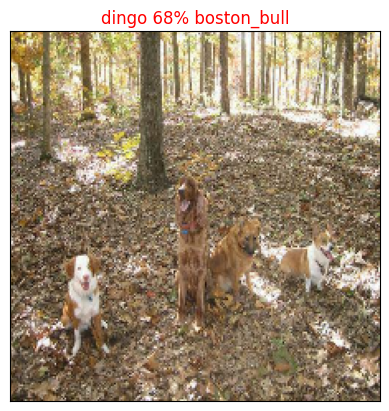

In [ ]:
plot_pred(prediction_probabilites=predictions,
          labels=val_labels,
          images=val_images,n=81)

In [ ]:
len(val_labels),len(val_images)

(200, 200)

In [ ]:
val_labels

['cairn',
 'scotch_terrier',
 'basset',
 'bluetick',
 'airedale',
 'bedlington_terrier',
 'keeshond',
 'old_english_sheepdog',
 'saint_bernard',
 'border_collie',
 'yorkshire_terrier',
 'border_collie',
 'yorkshire_terrier',
 'whippet',
 'english_foxhound',
 'standard_poodle',
 'irish_setter',
 'african_hunting_dog',
 'vizsla',
 'irish_water_spaniel',
 'flat-coated_retriever',
 'samoyed',
 'cairn',
 'blenheim_spaniel',
 'welsh_springer_spaniel',
 'scottish_deerhound',
 'komondor',
 'norwich_terrier',
 'cardigan',
 'dingo',
 'dandie_dinmont',
 'walker_hound',
 'walker_hound',
 'mexican_hairless',
 'eskimo_dog',
 'siberian_husky',
 'welsh_springer_spaniel',
 'doberman',
 'mexican_hairless',
 'kuvasz',
 'labrador_retriever',
 'wire-haired_fox_terrier',
 'english_foxhound',
 'collie',
 'toy_poodle',
 'groenendael',
 'boston_bull',
 'standard_poodle',
 'miniature_poodle',
 'chihuahua',
 'staffordshire_bullterrier',
 'vizsla',
 'norfolk_terrier',
 'pug',
 'bedlington_terrier',
 'affenpinsche

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Now we've got one function to visualize our model top redictions , let's make another to view our model top 10 predictions

This function will-:
* Take an input of prediction probabilities  array and a ground truth array an integer
* Find the predcition using `get_pred_labels()`
* FInd the top 10-:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Predicition labels
* Plot the top 20 prediction probablilities values and the truth label green

In [ ]:
def plot_pred_conf(prediction_probabilities,labels,n=1):
  """
  Plus the top 10 highhest prediction confidence along with the truth label for smaple n.
  """
  pred_prob,true_label=prediction_probabilities[n],labels[n]
  # Get thw predicted labels-:
  pred_label=get_pred_label(pred_prob)

  #FInd the top 10 prediction confidence indexes
  top_10_pred_indexes=pred_prob.argsort()[-10:][::-1]

  # FInd the top 10 prediction confidence values
  top_10_pred_values=pred_prob[top_10_pred_indexes]

  #find the top 10 prediction labels
  top_10_pred_labels=unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot=plt.bar(np.arange(len(top_10_pred_labels)),
                   top_10_pred_labels,color='grey')
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation='vertical')
  # Change color of true label
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels==true_label)].set_color('green')
  else:
    pass

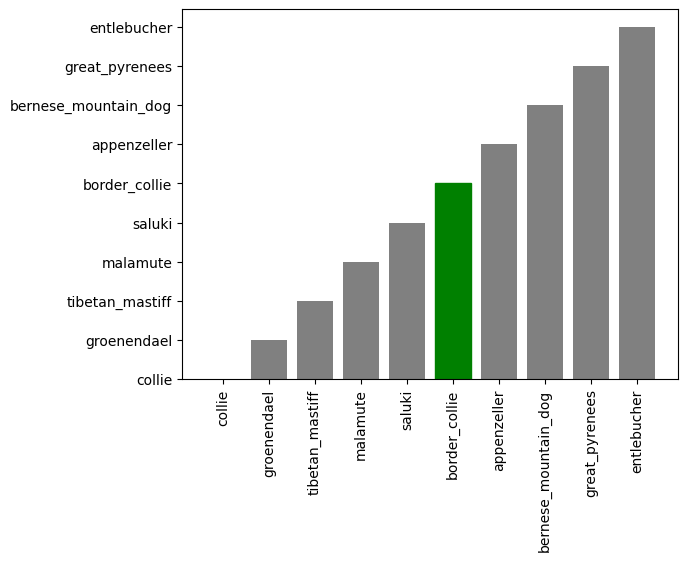

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,labels=val_labels,n=9)

Now we've got some function to help us visualize our predctions and evaluate our  model , lets; check out

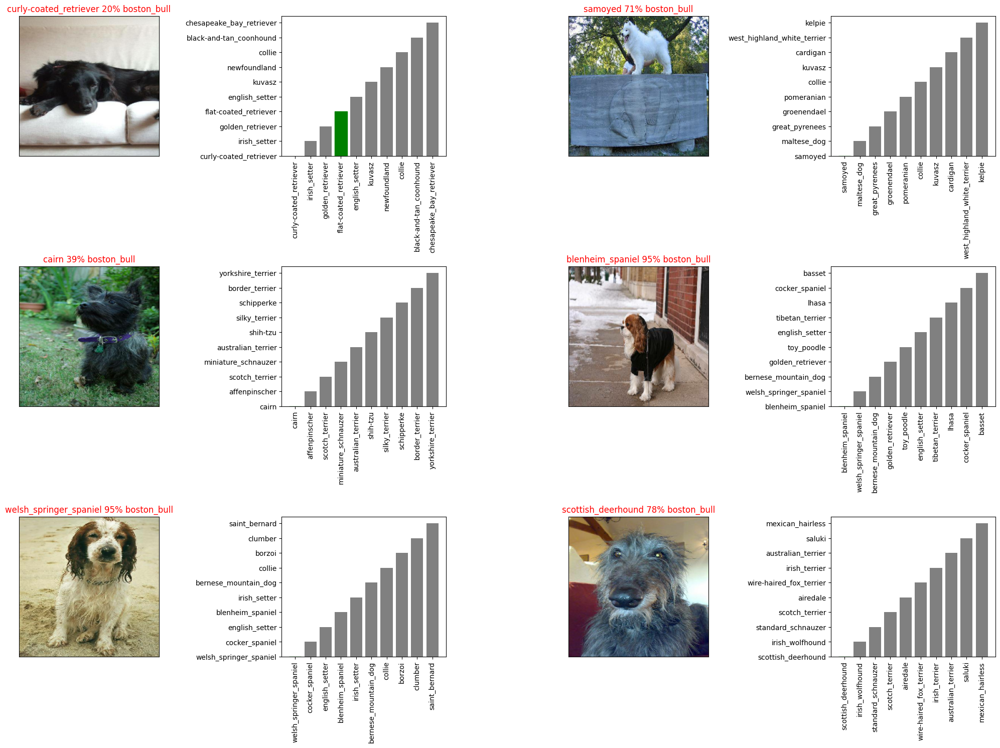

In [ ]:
# LEt check out a few prediction and their different values
i_multiplier=20
num_rows=3
num_cols=2
num_images=num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(prediction_probabilites=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)

plt.tight_layout()
plt.show()

# Create Confusion mAtrix on Own

## Saving and reloading a trained model

In [ ]:
#CReate a function to save a model
def save_model(model,suffix=None):
  """
  Saves a given model in a model directory and appends a suffix (strings)
  """
  #Create a model directroy pathname with current time
  modeldir=os.path.join('/content/drive/MyDrive/Dog Vision/dog-breed-identification/models')
  model_path=modeldir+"-"+suffix+'.h5' #save format of model
  print(f'Saving model to:{model_path}....')
  model.save(model_path)
  return model_path


In [ ]:
# CReate a function to load a trianed mode;
def load_model(model_path):
  """
  Loads a saved model from a specificed path.
  """
  print(f'Loading saved model from :{model_path}')
  model=tf.keras.models.load_model(model_path,custom_objects={'KerasLayer':hub.KerasLayer})
  return model

In [ ]:
#SAve our model trained on 100 images
save_model(model,suffix='1000-images-mobilenetv2-Adam')

Saving model to:/content/drive/MyDrive/Dog Vision/dog-breed-identification/models-1000-images-mobilenetv2-Adam.h5....


'/content/drive/MyDrive/Dog Vision/dog-breed-identification/models-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# load a trained model
loaded_1000_images_model=load_model('/content/drive/MyDrive/Dog Vision/dog-breed-identification/models/models-1000-images-mobilenetv2-Adam.h5')

Loading saved model from :/content/drive/MyDrive/Dog Vision/dog-breed-identification/models/models-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evalujate the loaded model
loaded_1000_images_model.evaluate(val_data)

7/7 [==============================] - 1s 95ms/step - loss: 1.2610 - accuracy: 0.6750


[1.2610273361206055, 0.675000011920929]

# Training a big dog model (on the full data)

In [ ]:
len(X),len(y)

(10222, 10222)

In [ ]:
len(X_train)

800

In [ ]:
# create a data batch with the full dataset
full_data=create_data_batches(X,y)

Creating training data batches....


In [ ]:
len(full_data)

320

In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
full_model=create_model()

NameError: ignored

In [ ]:
# Create full model callbacks
full_model_tensorboard=create_tensorboard_callback()
#no validation set when training on all the data , so we can't monitor validation accuracy
full_model_early_stopping=tf.keras.callbacks.EarlyStopping(monitor='accuracy',patience=3)

## Runnig the above cell below will take a little while maybe upto 30min for the first epoch because the GPU we're using in the runtime to load all the images into memory.

In [ ]:
#FIt the full model to the full data
full_model.fit(x=full_data,epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 3371s 11s/step - loss: 1.3548 - accuracy: 0.6649
Epoch 2/100
320/320 [==============================] - 38s 120ms/step - loss: 0.4022 - accuracy: 0.8822
Epoch 3/100
320/320 [==============================] - 34s 107ms/step - loss: 0.2346 - accuracy: 0.9338
Epoch 4/100
320/320 [==============================] - 36s 113ms/step - loss: 0.1527 - accuracy: 0.9629
Epoch 5/100
320/320 [==============================] - 34s 107ms/step - loss: 0.1057 - accuracy: 0.9785
Epoch 6/100
320/320 [==============================] - 36s 113ms/step - loss: 0.0775 - accuracy: 0.9877
Epoch 7/100
320/320 [==============================] - 35s 109ms/step - loss: 0.0581 - accuracy: 0.9919
Epoch 8/100
320/320 [==============================] - 35s 108ms/step - loss: 0.0452 - accuracy: 0.9949
Epoch 9/100
320/320 [==============================] - 36s 114ms/step - loss: 0.0377 - accuracy: 0.9954
Epoch 10/100
320/320 [==============================] - 35s 108m

In [ ]:
save_model(full_model,suffix='full_image-set-mobilenetv2-Adam')

Saving model to:/content/drive/MyDrive/Dog Vision/dog-breed-identification/models-full_image-set-mobilenetv2-Adam.h5....


'/content/drive/MyDrive/Dog Vision/dog-breed-identification/models-full_image-set-mobilenetv2-Adam.h5'

In [ ]:
len(X)  ,print(f"TIme to fit the full data model took -:",round(3371/60)," minutes")

NameError: ignored

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
loaded_full_model=load_model('/content/drive/MyDrive/Dog Vision/dog-breed-identification/models/models-full_image-set-mobilenetv2-Adam.h5')

Loading saved model from :/content/drive/MyDrive/Dog Vision/dog-breed-identification/models/models-full_image-set-mobilenetv2-Adam.h5


## MAKING PRediction on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make prediction on the test data , we'll have to get into the same format.

Luckily we created `create_dats_batched()` earlier which can take a list of filenames and convert them into Tensor batches.

To make predictions on the test data , we'll :
* Get the test image filenames
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to True (since the test data doesn't have labels).
* Make a predictions array by passing to the `predict()` method called on our model.

In [ ]:
# load test image filenames
import os
test_path='/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/'
test_filenames=[test_path+fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/e7b608110b0e29120d8740f37e85f3d0.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/e702ddff98bd0b05ab200ffb43fb080a.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/e745d75a74a9cbdc917e7775febd88e8.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/e715c53e3d189a20760ef4d891a865dc.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/e751e319cfdc9912ae2e5da2a9b053e0.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/e75eb1ed7b8e53fec8eb9e03c57153b2.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/e7b357150635c250757363718e4dae86.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/e6da14858db7781843db6af91551f627.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/e7dc8cc599049ea9fa2a172c88646c57.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identific

In [ ]:
len(test_filenames)

10357

In [ ]:
#Create test data batch
test_data=create_data_batches(test_filenames,test_data=True)

Creating test data batches.,...


In [ ]:
len(test_data)

324

## Calling `predict()` on our full model and passing it the test data will take a long time to run (about an~ 1 hour)

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions=loaded_full_model.predict(test_data,verbose=1)

324/324 [==============================] - 4072s 13s/step


In [ ]:
import numpy as np
np.savetxt('/content/drive/MyDrive/Dog Vision/dog-breed-identification/pred_array.csv',test_predictions,delimiter=',')

In [ ]:
#load predictions (NUMPY array) from csv file
test_predictions=np.loadtxt('/content/drive/MyDrive/Dog Vision/dog-breed-identification/pred_array.csv',delimiter=',')

## Preparing test datset predictions for Kaggle

Looking at the kaggle sample submission , we find that it wants our models prediction probabiliity outputs in a  DATAFRAME with an ID and column ofr each different dog breed.
https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed
* Add data to the ID column by extracting the test image ID's from their filepaths
* Add data (the prediction probablilities ) to each of the dog breed columns.
* EXport the DataFrame as a CSV to submit it to KAggle.

In [ ]:
# Create a pandas DataFrame with empty column|s
preds_df=pd.DataFrame(columns=['id']+list(unique_breeds))
preds_df.head()

,id,boston_bull,dingo,pekinese,bluetick,golden_retriever,bedlington_terrier,borzoi,basenji,scottish_deerhound,...,blenheim_spaniel,silky_terrier,sussex_spaniel,german_short-haired_pointer,french_bulldog,bouvier_des_flandres,tibetan_mastiff,english_springer,cocker_spaniel,rottweiler


In [ ]:
# append test image ID's to predictions DATAFRAME

test_id=[os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df[id]=test_id

In [ ]:
preds_df.head()

,id,boston_bull,dingo,pekinese,bluetick,golden_retriever,bedlington_terrier,borzoi,basenji,scottish_deerhound,...,silky_terrier,sussex_spaniel,german_short-haired_pointer,french_bulldog,bouvier_des_flandres,tibetan_mastiff,english_springer,cocker_spaniel,rottweiler,140186629410768
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,e7b608110b0e29120d8740f37e85f3d0
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,e702ddff98bd0b05ab200ffb43fb080a
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,e745d75a74a9cbdc917e7775febd88e8
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,e715c53e3d189a20760ef4d891a865dc
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,e751e319cfdc9912ae2e5da2a9b053e0


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)]=test_predictions
preds_df.head()

,id,boston_bull,dingo,pekinese,bluetick,golden_retriever,bedlington_terrier,borzoi,basenji,scottish_deerhound,...,silky_terrier,sussex_spaniel,german_short-haired_pointer,french_bulldog,bouvier_des_flandres,tibetan_mastiff,english_springer,cocker_spaniel,rottweiler,140186629410768
0,NaN,5.688443e-07,1.175681e-09,8.180194e-05,2.893027e-09,4.715255e-11,1.890873e-10,1.150125e-10,3.798460e-10,5.982280e-11,...,3.780453e-08,5.731040e-09,2.057086e-09,1.911819e-07,1.060206e-09,1.104459e-08,6.384766e-11,1.672841e-10,2.700413e-08,e7b608110b0e29120d8740f37e85f3d0
1,NaN,8.073979e-09,1.070810e-06,2.322009e-05,2.002574e-10,1.282966e-09,9.732021e-09,3.103169e-09,3.547502e-07,5.994052e-10,...,4.147768e-06,1.142787e-06,3.439734e-09,1.257054e-03,3.737756e-06,6.293268e-08,3.257732e-08,1.458296e-05,2.600913e-09,e702ddff98bd0b05ab200ffb43fb080a
2,NaN,7.296096e-10,3.503946e-06,3.042575e-09,8.307450e-08,2.302950e-06,3.077837e-12,3.853925e-12,1.022632e-06,9.898626e-12,...,9.624916e-08,1.497533e-07,6.960102e-09,1.284832e-10,2.429264e-11,1.049276e-09,1.134211e-09,6.191810e-10,7.183743e-08,e745d75a74a9cbdc917e7775febd88e8
3,NaN,5.491993e-09,1.248396e-07,1.492299e-10,2.194040e-04,2.679573e-08,8.116389e-06,3.033503e-10,5.196966e-06,1.608878e-07,...,3.454245e-08,1.835966e-09,7.033856e-06,3.311355e-09,1.223521e-10,1.144280e-08,6.365288e-06,9.410390e-08,1.880749e-07,e715c53e3d189a20760ef4d891a865dc
4,NaN,5.668612e-13,3.329133e-13,2.209283e-13,3.280215e-13,3.997254e-13,4.765535e-13,3.724438e-12,4.058422e-12,4.453224e-13,...,3.903118e-12,8.009970e-10,6.614997e-11,8.467191e-13,9.965810e-14,2.976024e-13,4.413686e-08,4.214749e-09,4.732309e-14,e751e319cfdc9912ae2e5da2a9b053e0


In [ ]:
# Save our prediction df to csv for submission to Kaggle
preds_df.to_csv('/content/drive/MyDrive/Dog Vision/dog-breed-identification/full_model_predictions_submission_1_mobilenetv2.csv',
                index=False)

## MAking prediction on custom images

To make prediction on custom images , we'll ⁉* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. and since our custom images won't have labels , we set the `test_data` parameter to True.
* pass the custom image data to our model's `predict()` model.
* Convert the prediction output probablilities to predictions labels.
* Compare the predicted labels to the custom images.